In [33]:
# ! pip install scikit-image

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import time
from skimage import segmentation, color, graph

In [19]:
BlackPanther_bgr = cv2.imread("./Input_Images/BlackPanther.jpg")
Fish_bgr = cv2.imread("./Input_Images/Fish.jpg")
Horse_bgr = cv2.imread("./Input_Images/Horse.jpg")

BlackPanther_rgb = cv2.cvtColor(BlackPanther_bgr, cv2.COLOR_BGR2RGB)
Fish_rgb = cv2.cvtColor(Fish_bgr, cv2.COLOR_BGR2RGB)
Horse_rgb = cv2.cvtColor(Horse_bgr, cv2.COLOR_BGR2RGB)

print("Black Panther Data Type:", BlackPanther_rgb.dtype)
print("Fish Data Type:", Fish_rgb.dtype)
print("Horse Data Type:", Horse_rgb.dtype)

Black Panther Data Type: uint8
Fish Data Type: uint8
Horse Data Type: uint8


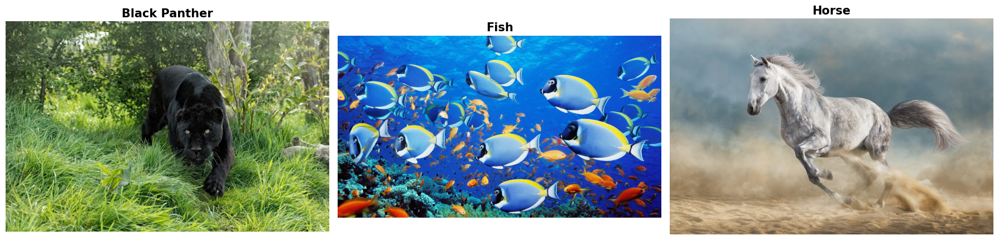

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

images = [BlackPanther_rgb, Fish_rgb, Horse_rgb]
titles = ["Black Panther", "Fish", "Horse"]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img) 
    ax.set_title(title, fontsize=15, fontweight="bold")
    ax.axis("off")

plt.tight_layout()
plt.show()

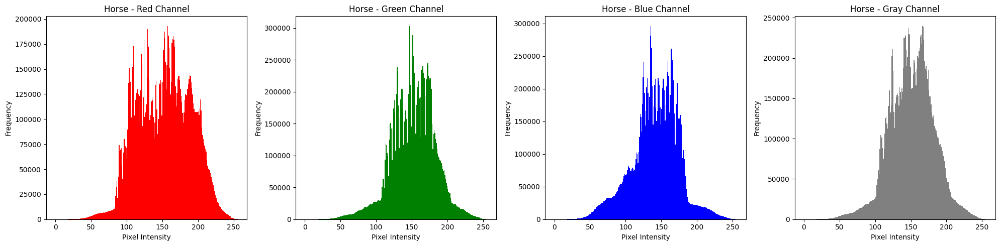

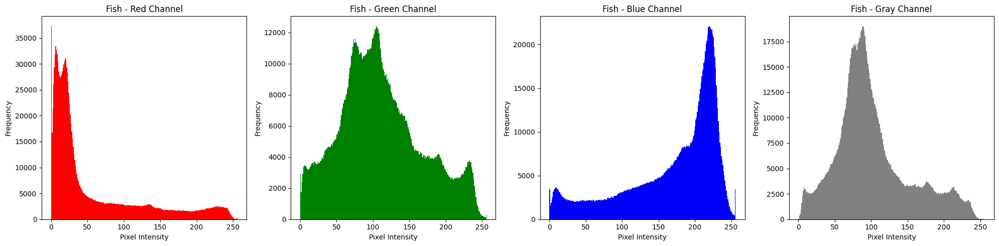

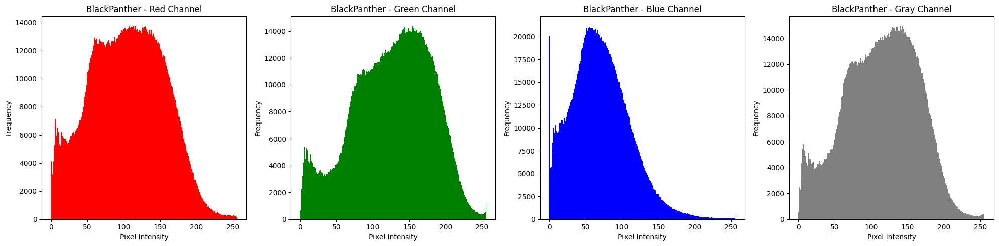

In [21]:
def plot_channel_histograms(image_rgb, image_name, output_dir='./Output_Images/Part_1'):
    image_gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    R, G, B = cv2.split(image_rgb)

    channels = [R, G, B, image_gray]
    colors = ['red', 'green', 'blue', 'gray']
    titles = ['Red Channel', 'Green Channel', 'Blue Channel', 'Gray Channel']

    plt.figure(figsize=(20, 5))
    for i, (channel, color, title) in enumerate(zip(channels, colors, titles), start=1):
        plt.subplot(1, 4, i)
        plt.hist(channel.ravel(), bins=256, range=[0, 256], color=color)
        plt.title(f'{image_name} - {title}')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{image_name}_Histograms.png'))
    plt.show()

    return image_gray

Horse_gray = plot_channel_histograms(Horse_rgb, 'Horse')
Fish_gray = plot_channel_histograms(Fish_rgb, 'Fish')
BlackPanther_gray = plot_channel_histograms(BlackPanther_rgb, 'BlackPanther')


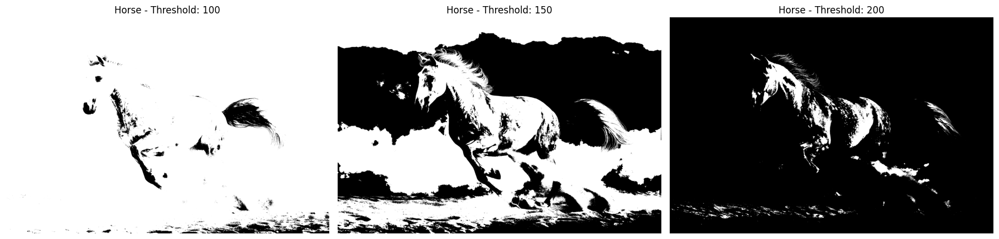

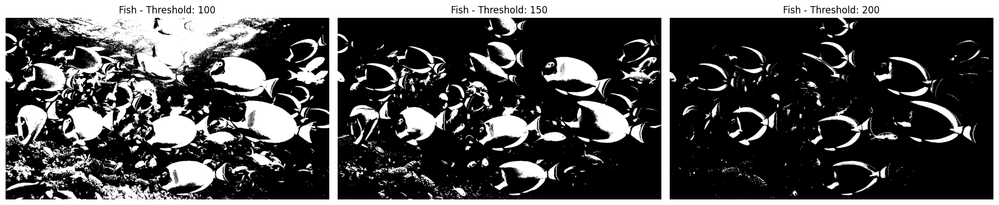

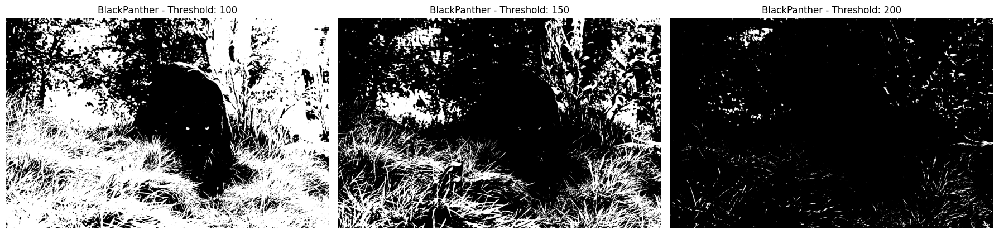

In [ ]:
def apply_threshold(image_gray, image_name, threshold_values, output_dir='./Output_Images/Part_1'):
    if threshold_values is None:
        threshold_values = [100, 150, 200]
        
    plt.figure(figsize=(6 * len(threshold_values), 6))

    for i, t in enumerate(threshold_values, start=1):
        _, thresh = cv2.threshold(image_gray, t, 255, cv2.THRESH_BINARY)
        cv2.imwrite(os.path.join(output_dir, f'{image_name}_Thresh_{t}.jpg'), thresh)

        plt.subplot(1, len(threshold_values), i)
        plt.imshow(thresh, cmap='gray')
        plt.title(f'{image_name} - Threshold: {t}')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{image_name}_Thresholds_Comparison.png'))
    plt.show()

apply_threshold(Horse_gray, 'Horse')
apply_threshold(Fish_gray, 'Fish',)
apply_threshold(BlackPanther_gray, 'BlackPanther')



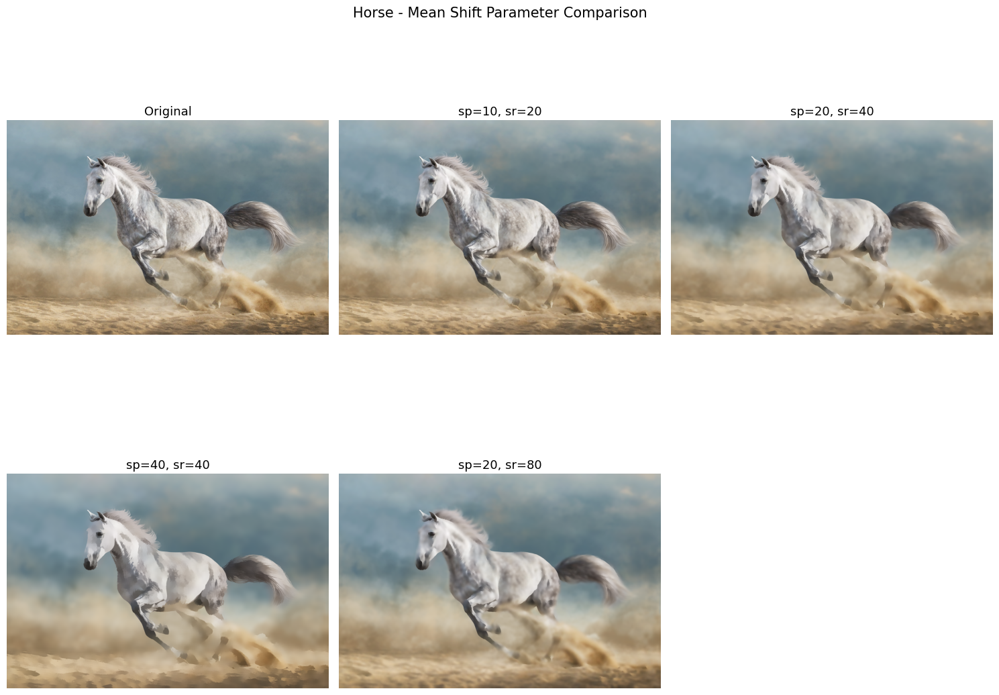

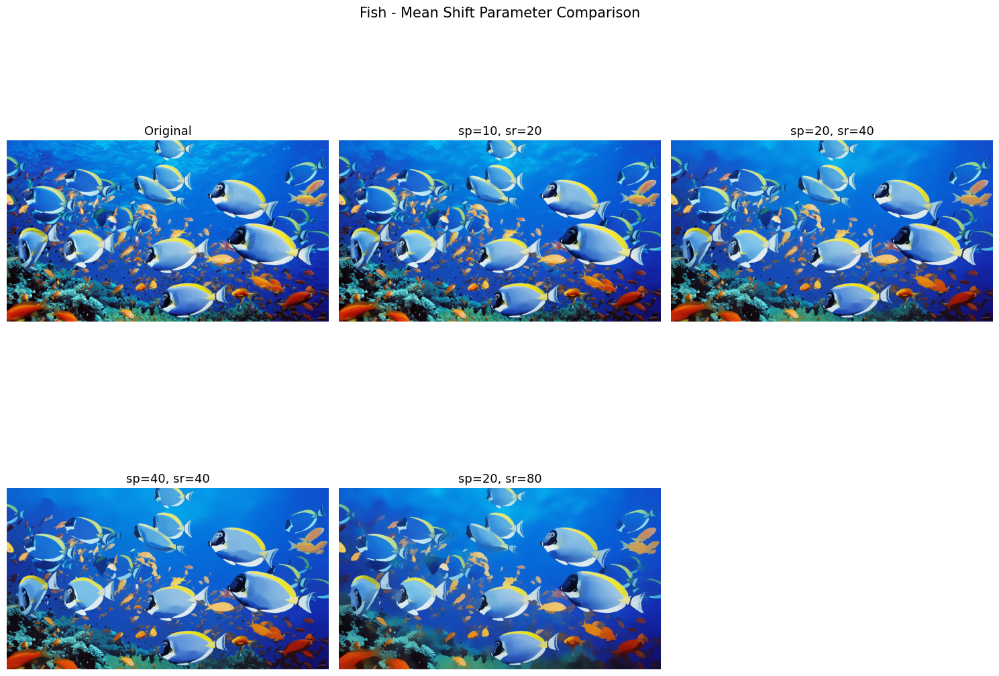

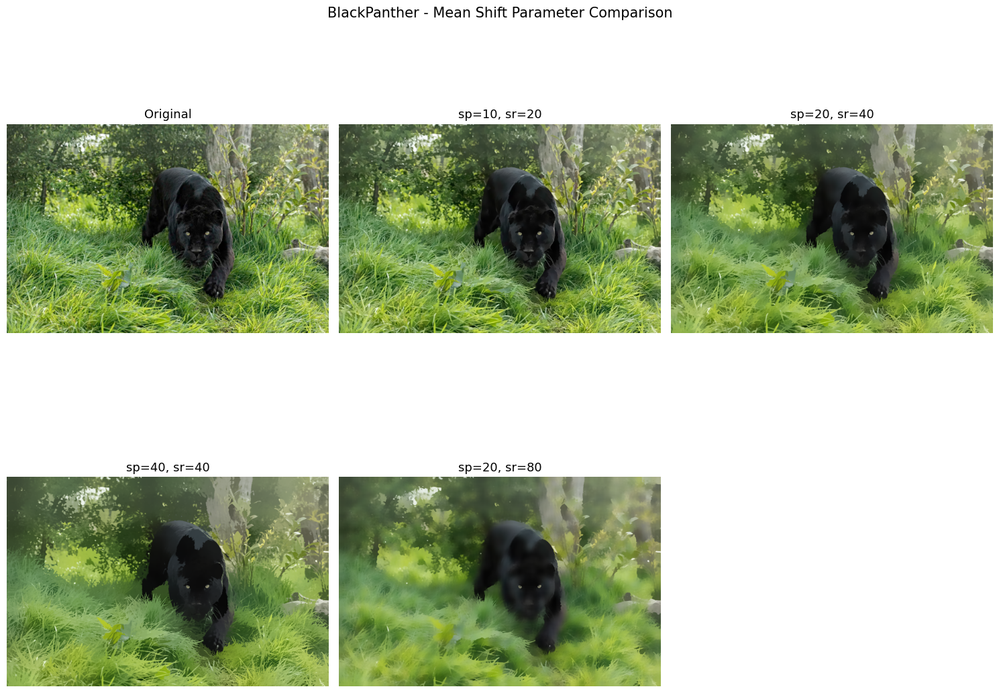

In [ ]:
def compare_mean_shift_params(image_rgb, image_name, param_list=None, term_crit=None, output_dir='./Output_Images/Part_2'):
    if term_crit is None:
        term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_MAX_ITER, 5, 1)
    if param_list is None:
        param_list = [
            (10, 20),   
            (20, 40),   
            (40, 40),   
            (20, 80),  
        ]

    n = len(param_list)
    plt.figure(figsize=(6 * (n + 1) // 2, 12))

    plt.subplot(2, (n + 2) // 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original', fontsize=13)
    plt.axis('off')

    results = {}
    for i, (sp, sr) in enumerate(param_list):
        shifted = cv2.pyrMeanShiftFiltering(image_rgb, sp, sr, termcrit=term_crit)
        results[(sp, sr)] = shifted

        shifted_bgr = cv2.cvtColor(shifted, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(output_dir, f'{image_name}_MeanShift_sp{sp}_sr{sr}.jpg'), shifted_bgr)

        plt.subplot(2, (n + 2) // 2, i + 2)
        plt.imshow(shifted)
        plt.title(f'sp={sp}, sr={sr}', fontsize=13)
        plt.axis('off')

    plt.suptitle(f'{image_name} - Mean Shift Parameter Comparison', fontsize=15)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{image_name}_MeanShift_comparison.jpg'))
    plt.show()

    return results


horse_results = compare_mean_shift_params(Horse_rgb, 'Horse')
fish_results = compare_mean_shift_params(Fish_rgb, 'Fish')
bp_results = compare_mean_shift_params(BlackPanther_rgb, 'BlackPanther')

Normalized Cut Execution Time for Horse: 79.13 seconds


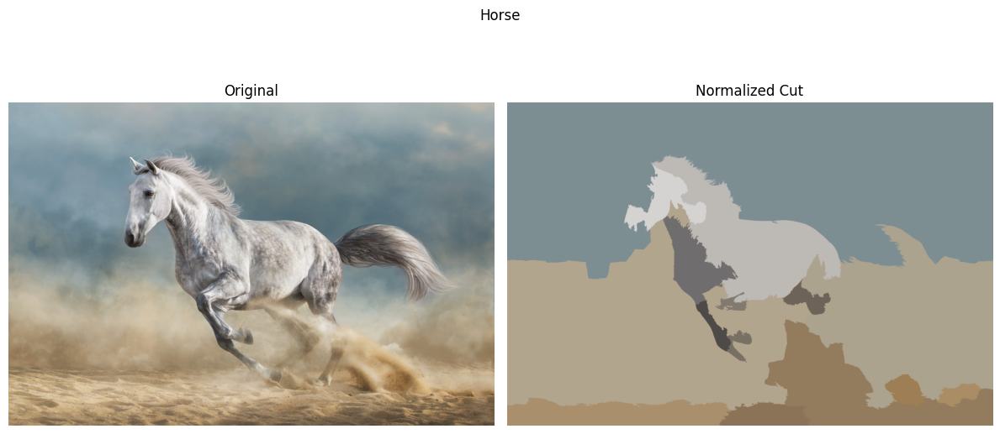

Normalized Cut Execution Time for Fish: 15.17 seconds


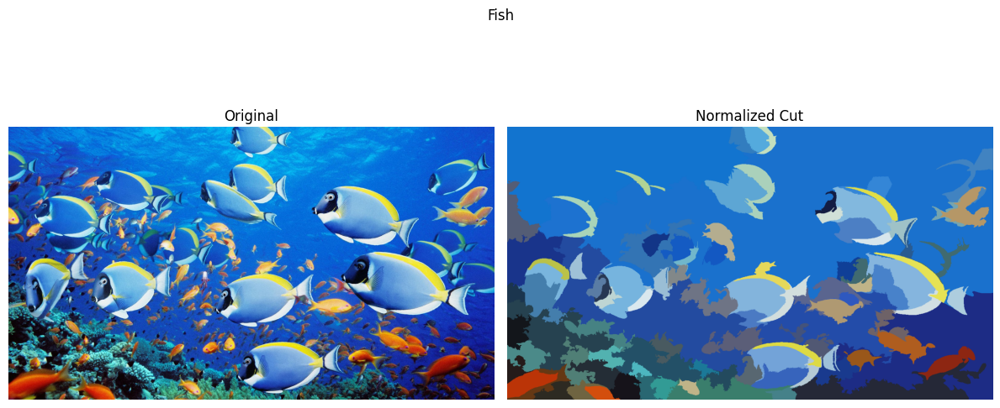

Normalized Cut Execution Time for BlackPanther: 10.81 seconds


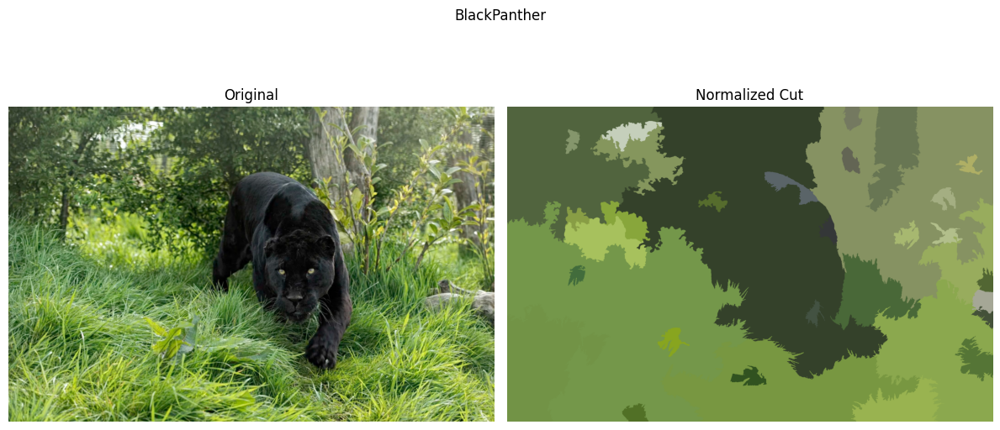

In [36]:
def apply_normalized_cut(image_rgb, image_name, compactness=30, n_segments=400):
    start_time = time.time()

    labels1 = segmentation.slic(image_rgb, compactness=compactness, n_segments=n_segments, start_label=1)
    rag = graph.rag_mean_color(image_rgb, labels1, mode='similarity')
    labels2 = graph.cut_normalized(labels1, rag)
    result = color.label2rgb(labels2, image_rgb, kind='avg', bg_label=0)

    print(f"Normalized Cut Execution Time for {image_name}: {time.time() - start_time:.2f} seconds")

    result_bgr = cv2.cvtColor((result * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    cv2.imwrite(f'./Output_Images/Part_3/{image_name}_NormalizedCut.jpg', result_bgr)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1); plt.imshow(image_rgb); plt.title('Original'); plt.axis('off')
    plt.subplot(1, 2, 2); plt.imshow(result); plt.title('Normalized Cut'); plt.axis('off')
    plt.suptitle(image_name); plt.tight_layout(); plt.show()

    return result

horse_ncut  = apply_normalized_cut(Horse_rgb,       'Horse')
fish_ncut   = apply_normalized_cut(Fish_rgb,        'Fish')
bp_ncut     = apply_normalized_cut(BlackPanther_rgb,'BlackPanther')


In [39]:
def compare_normalized_cut_params(image_rgb, image_name, param_list=None):
    if param_list is None:
        param_list = [
            {'compactness': 10, 'n_segments': 100},   
            {'compactness': 30, 'n_segments': 200},   
            {'compactness': 50, 'n_segments': 400},   
            ]
        
    n = len(param_list)
    results = []
    times = []

    for params in param_list:
        compactness = params.get('compactness', 30)
        n_segments = params.get('n_segments', 400)

        start_time = time.time()
        labels1 = segmentation.slic(image_rgb, compactness=compactness, n_segments=n_segments, start_label=1)
        rag = graph.rag_mean_color(image_rgb, labels1, mode='similarity')
        labels2 = graph.cut_normalized(labels1, rag)
        result = color.label2rgb(labels2, image_rgb, kind='avg', bg_label=0)
        elapsed = time.time() - start_time

        results.append(result)
        times.append(elapsed)

        print(f"[{image_name}] compactness={compactness}, n_segments={n_segments} -> Time: {elapsed:.2f}s")

    plt.figure(figsize=(6 * (n + 1), 6))
    plt.subplot(1, n + 1, 1)
    plt.imshow(image_rgb); plt.title('Original'); plt.axis('off')

    for i, (result, params, t) in enumerate(zip(results, param_list, times)):
        plt.subplot(1, n + 1, i + 2)
        plt.imshow(result)
        title = f"c={params.get('compactness', 30)}, n={params.get('n_segments', 400)}\n{t:.2f}s"
        plt.title(title, fontsize=10)
        plt.axis('off')

    plt.suptitle(f'Normalized Cut Comparison - {image_name}')
    plt.tight_layout()
    plt.savefig(f'./Output_Images/Part_3/{image_name}_NCut_Comparison.jpg')
    plt.show()

    return results, times


[Horse] compactness=10, n_segments=100 -> Time: 71.29s
[Horse] compactness=30, n_segments=200 -> Time: 73.40s
[Horse] compactness=50, n_segments=400 -> Time: 77.07s


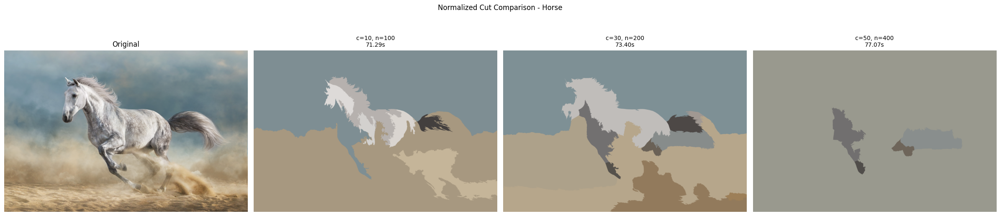

In [40]:
horse_results, horse_times = compare_normalized_cut_params(Horse_rgb, 'Horse')

[Fish] compactness=10, n_segments=100 -> Time: 7.30s
[Fish] compactness=30, n_segments=200 -> Time: 8.19s
[Fish] compactness=50, n_segments=400 -> Time: 12.05s


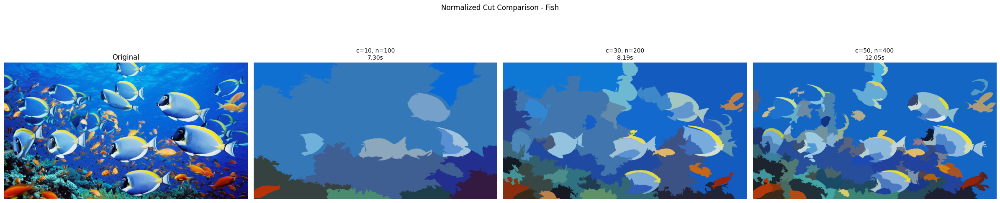

In [41]:
Fish_results, Fish_times = compare_normalized_cut_params(Fish_rgb, 'Fish')

[BlackPanther] compactness=10, n_segments=100 -> Time: 10.47s
[BlackPanther] compactness=30, n_segments=200 -> Time: 10.09s
[BlackPanther] compactness=50, n_segments=400 -> Time: 11.59s


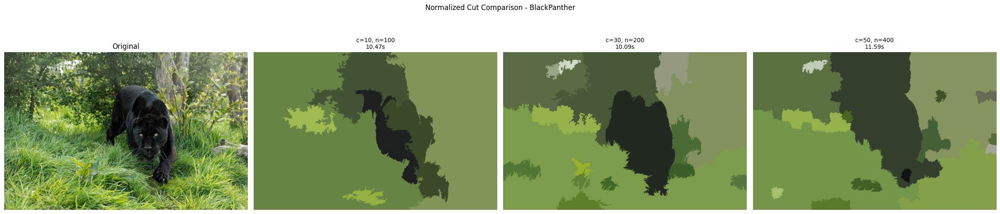

In [42]:
BlackPanther_results, BlackPanther_times = compare_normalized_cut_params(BlackPanther_rgb, 'BlackPanther')
